In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import os
detection_dataset ="/content/drive/MyDrive/Student/Ovi/Data_Set/Children's Dental/Pediatric dental disease detection dataset.zip"
os.system(f'unzip "{detection_dataset}" -d /content/Detection')


0

Train-Set


In [3]:
import json
import os

# Define paths
TRAIN_IMAGE_FOLDER = '/content/Detection/Pediatric dental disease detection dataset/Train/images'
TRAIN_LABEL_FOLDER = '/content/Detection/Pediatric dental disease detection dataset/Train/label'

TEST_IMAGE_FOLDER = '/content/Detection/Pediatric dental disease detection dataset/Test/images'
TEST_LABEL_FOLDER = '/content/Detection/Pediatric dental disease detection dataset/Test/label'

# Mapping to English
class_mapping = {
    '牙齿发育异常': 'Dental development abnormalities',
    '龋病': 'Dental caries',
    '根尖周炎': 'Apical periodontitis',
    '深窝沟': 'Deep fissure',
    '牙髓炎': 'Pulpitis',
    '其他': 'Others'
}



In [4]:
import os
import json
from collections import defaultdict
# === Initialize a dictionary to count class instances ===
class_counts = defaultdict(int)

# === Iterate over all JSON files in the label folder ===
for filename in os.listdir(TRAIN_LABEL_FOLDER):
    if filename.endswith('.json'):
        json_path = os.path.join(TRAIN_LABEL_FOLDER, filename)

        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

            shapes = data.get('shapes', [])
            for shape in shapes:
                label_cn = shape.get('label')
                label_en = class_mapping.get(label_cn, 'Unknown')
                class_counts[label_en] += 1

# === Print the class counts ===
print("Class instance counts across the dataset:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")


Class instance counts across the dataset:
Deep fissure: 31
Dental caries: 206
Apical periodontitis: 26
Others: 7
Dental development abnormalities: 19
Pulpitis: 17


In [5]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

In [6]:

# Extract English class names from the mapping
class_names = list(class_mapping.values())

# Generate random colors for each class
import numpy as np
colors = np.random.uniform(0, 255, size=(len(class_names), 3))


In [7]:
import cv2
import json
import glob
import random
import matplotlib.pyplot as plt

# Only one class now
class_names = ["Dental caries"]
colors = [(0, 255, 0)]  # green for caries

# Mapping from Chinese labels to English
class_mapping = {
    "龋病": "Dental caries",
    # other classes can be mapped but we'll filter them out anyway
}

def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0] - bboxes[2] / 2, bboxes[1] - bboxes[3] / 2
    xmax, ymax = bboxes[0] + bboxes[2] / 2, bboxes[1] + bboxes[3] / 2
    return xmin, ymin, xmax, ymax


def plot_box(image, bboxes, labels):
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        class_name = labels[box_num]

        # Only process Dental caries
        if class_name != "Dental caries":
            continue

        x1, y1, x2, y2 = yolo2bbox(box)
        xmin = int(x1 * w)
        ymin = int(y1 * h)
        xmax = int(x2 * w)
        ymax = int(y2 * h)

        color = colors[class_names.index(class_name)]

        # Draw bounding box
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color=color, thickness=2)

        # Draw label background
        font_scale = min(1, max(0.5, w / 500))
        font_thickness = min(2, max(1, int(w / 500)))
        tw, th = cv2.getTextSize(class_name, 0, font_scale, font_thickness)[0]
        p1, p2 = (xmin, ymin), (xmin + tw, ymin - th - 6)

        cv2.rectangle(image, p1, p2, color=color, thickness=-1)
        cv2.putText(image, class_name, (xmin, ymin - 2), cv2.FONT_HERSHEY_SIMPLEX,
                    font_scale, (255, 255, 255), font_thickness)

    return image


def plot(image_paths, label_paths, num_samples):
    all_training_images = sorted(glob.glob(image_paths + '/*.png'))
    all_training_labels = sorted(glob.glob(label_paths + '/*.json'))

    num_images = len(all_training_images)
    plt.figure(figsize=(15, 12))

    for i in range(num_samples):
        j = random.randint(0, num_images - 1)
        image = cv2.imread(all_training_images[j])
        image_height, image_width = image.shape[:2]

        with open(all_training_labels[j], 'r', encoding='utf-8') as f:
            data = json.load(f)
            bboxes = []
            labels = []

            for shape in data['shapes']:
                label_chinese = shape['label']
                label_english = class_mapping.get(label_chinese, None)

                # Only keep dental caries
                if label_english != "Dental caries":
                    continue

                points = shape['points']
                x1, y1 = points[0]
                x2, y2 = points[1]
                xmin, ymin = min(x1, x2), min(y1, y2)
                xmax, ymax = max(x1, x2), max(y1, y2)

                # Normalize for YOLO
                x_center = (xmin + xmax) / 2.0 / image_width
                y_center = (ymin + ymax) / 2.0 / image_height
                width = (xmax - xmin) / image_width
                height = (ymax - ymin) / image_height

                bboxes.append([x_center, y_center, width, height])
                labels.append(label_english)

        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i + 1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')

    plt.tight_layout()
    plt.show()


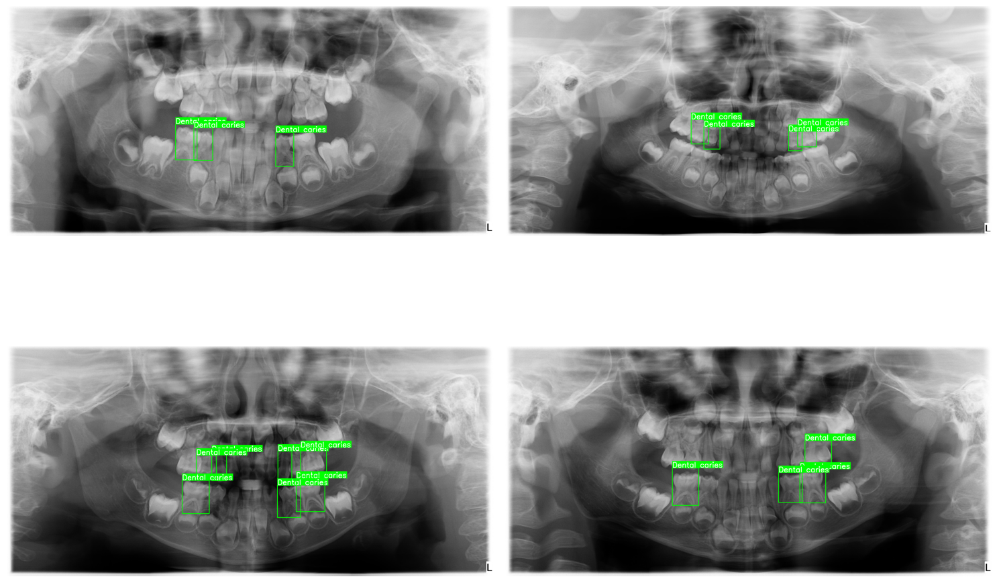

In [8]:
plot(
    image_paths='/content/Detection/Pediatric dental disease detection dataset/Train/images',
    label_paths='/content/Detection/Pediatric dental disease detection dataset/Train/label',
    num_samples=4,
)

In [ ]:
!pip install labelme

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 71.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 79.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 MB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 48.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 82.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.4/276.4 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.1 MB/s eta 0:00:00


In [9]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np

augmentation = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.15, p=0.4),
    A.ShiftScaleRotate(
        shift_limit=0.03,
        scale_limit=0.05,
        rotate_limit=10,
        border_mode=0,
        p=0.5
    ),
    A.GaussianBlur(blur_limit=(1, 2), p=0.2),
    A.GaussNoise(var_limit=(5.0, 20.0), p=0.1),
],
bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
)


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-3436479817.py:16: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(5.0, 20.0), p=0.1),


In [15]:
import os

im_path = "/content/yolo_dataset/images/train"

# List all files in the folder that are images
image_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")
image_files = [f for f in os.listdir(im_path) if f.lower().endswith(image_extensions)]

print(f"Total images: {len(image_files)}")


Total images: 539


In [13]:
import os
import json
from glob import glob
from PIL import Image
import numpy as np
import albumentations as A

# Paths
root_path = "/content/Detection/Pediatric dental disease detection dataset"
train_img_dir = os.path.join(root_path, "Train/images")
train_ann_dir = os.path.join(root_path, "Train/label")
test_img_dir = os.path.join(root_path, "Test/images")
test_ann_dir = os.path.join(root_path, "Test/label")

target_root = "/content/yolo_dataset"
os.makedirs(f"{target_root}/images/train", exist_ok=True)
os.makedirs(f"{target_root}/images/val", exist_ok=True)
os.makedirs(f"{target_root}/labels/train", exist_ok=True)
os.makedirs(f"{target_root}/labels/val", exist_ok=True)

# ✅ Only keep "Dental caries"
label_map = {'龋病': 'Dental caries'}
class_list = ['Dental caries']  # single class
image_extensions = ['.png', '.jpg', '.jpeg']

# ✅ Augmentation pipeline (works with YOLO bboxes)
augmentation = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.2),
        A.RandomBrightnessContrast(p=0.5),
        A.ShiftScaleRotate(scale_limit=0.1, rotate_limit=10, p=0.5)
    ],
    bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
)

def convert_labelme_to_yolo_boxes(json_file, img_size, label_map, class_list):
    """Convert LabelMe format to YOLO bboxes, keeping only Dental caries."""
    with open(json_file, encoding='utf-8') as f:
        data = json.load(f)

    img_w, img_h = img_size
    bboxes, class_labels = [], []

    for shape in data['shapes']:
        label_cn = shape['label']
        if label_cn not in label_map:  # skip all non-caries
            continue

        label_en = label_map[label_cn]
        class_id = class_list.index(label_en)

        # Get rectangle points
        points = shape['points']
        x_min = min(p[0] for p in points)
        y_min = min(p[1] for p in points)
        x_max = max(p[0] for p in points)
        y_max = max(p[1] for p in points)

        # Normalize to YOLO format
        x_center = (x_min + x_max) / 2.0 / img_w
        y_center = (y_min + y_max) / 2.0 / img_h
        width = (x_max - x_min) / img_w
        height = (y_max - y_min) / img_h

        # ✅ Keep only if box is valid (non-zero size)
        if width > 0 and height > 0:
            bboxes.append([x_center, y_center, width, height])
            class_labels.append(class_id)

    return bboxes, class_labels

def process_dir(image_dir, label_dir, split, augment_times=2):
    img_paths = sorted([f for f in glob(f"{image_dir}/*") if os.path.splitext(f)[1].lower() in image_extensions])
    count = 0

    for img_path in img_paths:
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        json_path = os.path.join(label_dir, base_name + ".json")
        if not os.path.exists(json_path):
            continue

        img = Image.open(img_path).convert("RGB")
        img_np = np.array(img)
        img_size = img.size  # (W, H)

        bboxes, class_labels = convert_labelme_to_yolo_boxes(json_path, img_size, label_map, class_list)

        # Skip if no Dental caries in the image
        if not bboxes:
            continue

        # Save original image + label
        img.save(f"{target_root}/images/{split}/{base_name}.png")
        with open(f"{target_root}/labels/{split}/{base_name}.txt", "w") as f:
            for i, box in enumerate(bboxes):
                f.write(f"{class_labels[i]} {' '.join(f'{x:.6f}' for x in box)}\n")
        count += 1

        # Augmentations
        for i in range(augment_times):
            augmented = augmentation(image=img_np, bboxes=bboxes, class_labels=class_labels)
            aug_img = Image.fromarray(augmented['image'])
            aug_bboxes = augmented['bboxes']
            aug_labels = augmented['class_labels']

            if not aug_bboxes:  # skip if augmentation removes boxes
                continue

            aug_name = f"{base_name}_aug{i}"
            aug_img.save(f"{target_root}/images/{split}/{aug_name}.png")
            with open(f"{target_root}/labels/{split}/{aug_name}.txt", "w") as f:
                for j, box in enumerate(aug_bboxes):
                    f.write(f"{aug_labels[j]} {' '.join(f'{x:.6f}' for x in box)}\n")
            count += 1

    print(f"{split.capitalize()} set processed: {count} images (including augmentations)")

# ✅ Run processing
process_dir(train_img_dir, train_ann_dir, "train", augment_times=10)
process_dir(test_img_dir, test_ann_dir, "val", augment_times=10)


Train set processed: 539 images (including augmentations)
Val set processed: 264 images (including augmentations)


Augmented Train Data

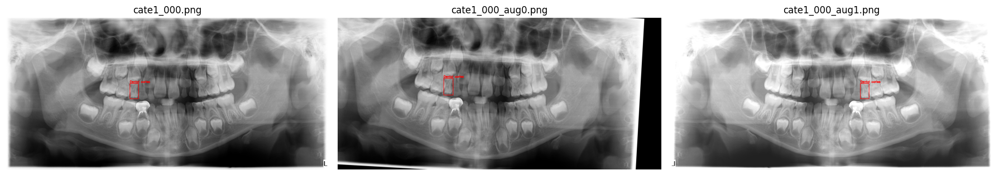

In [14]:
import os
import cv2
import matplotlib.pyplot as plt

# Paths - adjust if needed
augmented_img_dir = "/content/yolo_dataset/images/train"
augmented_label_dir = "/content/yolo_dataset/labels/train"

# Label names, same order as your class_list
label_map = {
    0: 'Dental caries'
}

# Check if directory exists
if not os.path.exists(augmented_img_dir):
    print(f"Directory does not exist: {augmented_img_dir}")
else:
    # List all images in train folder (with or without '_aug' in filename)
    images = sorted([f for f in os.listdir(augmented_img_dir) if f.endswith('.png')])

    # Show up to 3 images with bounding boxes
    num_samples = min(3, len(images))

    fig, axs = plt.subplots(1, num_samples, figsize=(18, 6))
    if num_samples == 1:
        axs = [axs]  # Make it iterable

    for i in range(num_samples):
        img_name = images[i]
        img_path = os.path.join(augmented_img_dir, img_name)
        label_path = os.path.join(augmented_label_dir, img_name.replace('.png', '.txt'))

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape

        # Draw boxes if label file exists
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    class_id, x_center, y_center, bw, bh = map(float, line.strip().split())
                    x1 = int((x_center - bw / 2) * w)
                    y1 = int((y_center - bh / 2) * h)
                    x2 = int((x_center + bw / 2) * w)
                    y2 = int((y_center + bh / 2) * h)
                    label = label_map.get(int(class_id), "Unknown")
                    cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(image, label, (x1, max(15, y1 - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(img_name)

    plt.tight_layout()
    plt.show()


Augmented test data

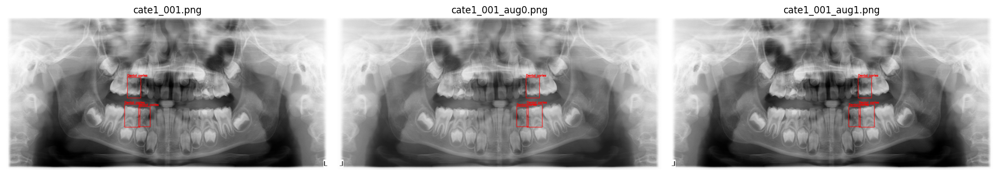

In [16]:
import os
import cv2
import matplotlib.pyplot as plt

# Paths - adjust if needed
augmented_img_dir = "/content/yolo_dataset/images/val"
augmented_label_dir = "/content/yolo_dataset/labels/val"

# Label names, same order as your class_list
label_map = {
    0: 'Dental caries'
}

# Check if directory exists
if not os.path.exists(augmented_img_dir):
    print(f"Directory does not exist: {augmented_img_dir}")
else:
    # List all images in train folder (with or without '_aug' in filename)
    images = sorted([f for f in os.listdir(augmented_img_dir) if f.endswith('.png')])

    # Show up to 3 images with bounding boxes
    num_samples = min(3, len(images))

    fig, axs = plt.subplots(1, num_samples, figsize=(18, 6))
    if num_samples == 1:
        axs = [axs]  # Make it iterable

    for i in range(num_samples):
        img_name = images[i]
        img_path = os.path.join(augmented_img_dir, img_name)
        label_path = os.path.join(augmented_label_dir, img_name.replace('.png', '.txt'))

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape

        # Draw boxes if label file exists
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    class_id, x_center, y_center, bw, bh = map(float, line.strip().split())
                    x1 = int((x_center - bw / 2) * w)
                    y1 = int((y_center - bh / 2) * h)
                    x2 = int((x_center + bw / 2) * w)
                    y2 = int((y_center + bh / 2) * h)
                    label = label_map.get(int(class_id), "Unknown")
                    cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(image, label, (x1, max(15, y1 - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(img_name)

    plt.tight_layout()
    plt.show()


In [17]:
data_yaml = """
path: /content/yolo_dataset
train: images/train
val: images/val

nc: 1
names:
  - Dental caries
"""

with open("/content/yolo_dataset/data.yaml", "w") as f:
    f.write(data_yaml)


In [18]:
!cat /content/yolo_dataset/data.yaml


path: /content/yolo_dataset
train: images/train
val: images/val

nc: 1
names:
  - Dental caries


In [19]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17533, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 17533 (delta 16), reused 0 (delta 0), pack-reused 17502 (from 5)
Receiving objects: 100% (17533/17533), 16.63 MiB | 19.09 MiB/s, done.
Resolving deltas: 100% (12012/12012), done.


In [20]:
%cd yolov5/
!pwd


/content/yolov5
/content/yolov5


In [21]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 84.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 35.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12


In [24]:
!python train.py \
  --img 512 \
  --batch 16 \
  --epochs 200 \
  --data /content/yolo_dataset/data.yaml \
  --weights yolov5s.pt \
  --patience 20


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-08-17 21:03:16.598587: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755464596.878404    5823 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755464596.960711    5823 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1755464597.494084    5823 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1755464597.494124    5823 computation_placer.cc:177] computation placer already registere

In [32]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [29]:
!python3 val.py --weights /content/yolov5/runs/train/exp/weights/best.pt --data /content/yolo_dataset/data.yaml --img 512 --batch-size 8 --iou-thres 0.5 --task 'val'
#for use test time augent add --augment in avove script

val: data=/content/yolo_dataset/data.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=8, imgsz=512, conf_thres=0.001, iou_thres=0.5, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-425-g85acef3a Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolo_dataset/labels/val.cache... 264 images, 0 backgrounds, 0 corrupt: 100% 264/264 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 33/33 [00:15<00:00,  2.07it/s]
                   all        264       1188      0.427      0.665      0.453      0.224
Speed: 0.1ms pre-process, 4.3ms inference, 3.3ms NMS per image at shape (8, 3, 512, 512)
Resul

Prediction

In [30]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 512 --conf 0.25 --source /content/yolo_dataset/images/val

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolo_dataset/images/val, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-425-g85acef3a Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/264 /content/yolo_dataset/images/val/cate1_001.png: 256x512 9 Dental cariess, 28.2ms
image 2/264 /content/yolo_dataset/images/val/cate1_001_aug0.png: 256x512 7 Dental cariess, 6.5ms
image 3/264 /content/yolo_dataset/images/val/cate1_001_aug1.png: 256x512 7 Dental cariess, 6.2m

Show Prediction

In [31]:
import os
import cv2
import matplotlib.pyplot as plt

# Set the directory containing images
image_dir = '/content/yolov5/runs/detect/exp2'

image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]

# Sort if needed
image_files.sort()

# Display images
for img_name in image_files:
    img_path = os.path.join(image_dir, img_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR (OpenCV) to RGB (Matplotlib)

    plt.imshow(image)
    plt.title(img_name)
    plt.axis('off')
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

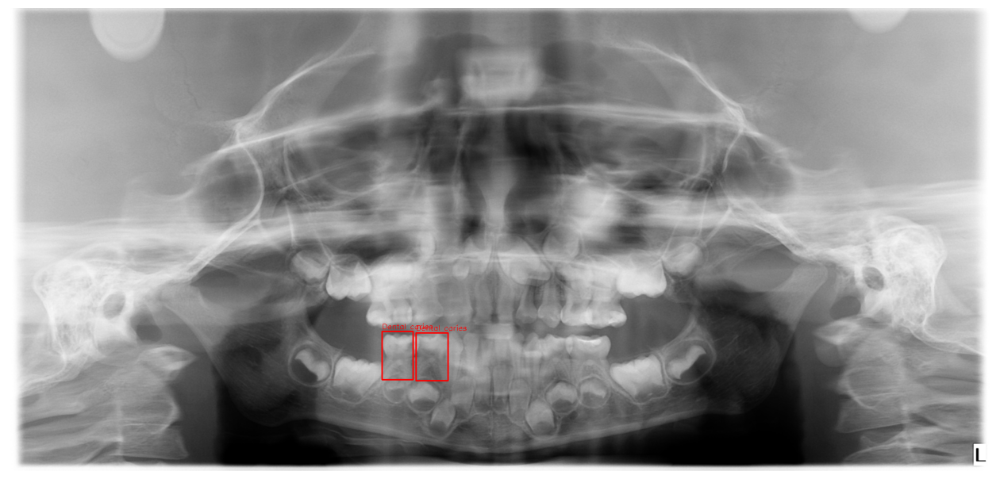

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Paths
img_path ="/content/yolo_dataset/images/val/cate2_001.png"
label_path ="/content/yolo_dataset/labels/val/cate2_001.txt"

# Load image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
h, w, _ = img.shape

# Load YOLO annotations
with open(label_path, 'r') as f:
    lines = f.readlines()

# Class names (must match your dataset)
class_names = [
    'Dental caries'
]

# Draw boxes
for line in lines:
    parts = line.strip().split()
    class_id = int(parts[0])
    x_center, y_center, box_w, box_h = map(float, parts[1:])

    # Convert YOLO format to pixel coordinates
    x1 = int((x_center - box_w / 2) * w)
    y1 = int((y_center - box_h / 2) * h)
    x2 = int((x_center + box_w / 2) * w)
    y2 = int((y_center + box_h / 2) * h)

    # Draw rectangle
    cv2.rectangle(img, (x1, y1), (x2, y2), color=(255,0,0), thickness=2)
    # Put label
    cv2.putText(img, class_names[class_id], (x1, y1-5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1)

# Show image
plt.figure(figsize=(16,12))
plt.imshow(img)
plt.axis('off')
plt.show()


In [ ]:
from google.colab import files
files.download('/content/yolov5/runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>